# 2b. 参考数据的内在分析

该笔记本分析用户提供的给定区域的参考自行车基础设施数据集的质量。 质量评估是“内在的”，即仅基于一个输入数据集，并且不使用数据集外部的信息。 对于将参考数据集与相应 OSM 数据进行比较的外在质量评估，请参阅笔记本 3a 和 3b。

该分析评估给定区域参考数据的“目的适应性”（[Barron et al., 2014](https://onlinelibrary.wiley.com/doi/10.1111/tgis.12073)）。 分析的结果可能与自行车规划和研究相关 - 特别是对于包括自行车基础设施网络分析的项目，在这种情况下，几何拓扑尤为重要。

由于评估不使用外部参考数据集作为基本事实，因此无法对数据质量做出普遍的声明。 这个想法是让那些使用自行车网络的人能够评估他们的数据是否足以满足他们的特定用例。 该分析有助于发现潜在的数据质量问题，但将结果的最终解释权留给用户。

该笔记本利用了一系列先前调查 OSM/VGI 数据质量的项目的质量指标，例如  [Ferster et al. (2020)](https://www.tandfonline.com/doi/full/10.1080/15568318.2018.1519746), [Hochmair et al. (2015)](https://onlinelibrary.wiley.com/doi/abs/10.1111/tgis.12081), [Barron et al. (2014)](https://onlinelibrary.wiley.com/doi/10.1111/tgis.12073), and [Neis et al. (2012](https://www.mdpi.com/1999-5903/4/1/1)).

<div class="alert alert-block alert-info">
<b>Prerequisites &amp; Input/Output</b>
<p>
提前运行笔记本 1b。
    
此笔记本的输出文件（数据、地图、绘图）保存到 <span style="font-family:courier;">../results/REFERENCE/[study_area]/</span> 子文件夹中。
</p>
</div>

<div class="alert alert-block alert-info">
<b>Familiarity required</b>
<p>
为了正确解释一些空间数据质量指标，需要对该区域有一定的了解。
</p>
</div>



<br />

In [1]:
# Load libraries, settings and data

import json
import pickle
import warnings
from collections import Counter
import math

import contextily as cx
import folium
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import osmnx as ox
import pandas as pd
import yaml
from matplotlib import cm, colors

from src import evaluation_functions as eval_func
from src import plotting_functions as plot_func

%run ../settings/yaml_variables.py
%run ../settings/plotting.py
%run ../settings/tiledict.py
%run ../settings/load_refdata.py
%run ../settings/df_styler.py
%run ../settings/paths.py

warnings.filterwarnings("ignore")

grid = ref_grid

D:\tmp_resource\BikeDNA-main\BikeDNA-main\scripts\settings\plotting.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_name, n)
D:\tmp_resource\BikeDNA-main\BikeDNA-main\scripts\settings\plotting.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_name)


Reference graphs loaded successfully!
Reference data loaded successfully!


<string>:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
<string>:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


## 数据完整性

### 网络密度

在此设置中，网络密度是指边的长度或每平方公里的节点数。 这是空间（道路）网络中网络密度的通常定义，它与网络科学中更常见的“结构”网络密度不同。 如果不与参考数据集进行比较，网络密度本身并不表明空间数据质量。 然而，对于熟悉研究区域的任何人来说，网络密度可以表明该区域的某些部分是否映射不足或过度。

**方法**

这里的密度不是基于边缘的几何长度，而是基于基础设施的计算长度。 例如，一条 100 米长的双向路径贡献了 200 米的自行车基础设施。 该方法用于考虑绘制自行车基础设施的不同方式，否则可能会导致网络密度出现较大偏差。 使用“compute_network_densis”，可以计算每单位面积的元素数量（节点、悬空节点和基础设施总长度）。 密度计算两次：首先计算整个网络的研究区域（“全局密度”），然后计算每个网格单元（“局部密度”）。 全局和局部密度都是针对整个网络以及受保护和未受保护的基础设施计算的。

**解释**

由于此处进行的分析是内在的，即不使用外部信息，因此无法知道低密度值是由于测绘不完整还是由于该地区实际缺乏基础设施所致。 然而，网格单元密度值的比较可以提供一些见解，例如：
* 基础设施密度低于平均水平表明局部网络较为稀疏
* 高于平均节点密度表明网格单元内交叉点相对较多
* 悬挂节点密度高于平均水平表明网格单元中存在相对较多的死角

#### 全球网络密度

<br />

In [2]:
# Entire study area
edge_density, node_density, dangling_node_density = eval_func.compute_network_density(
    (ref_edges_simplified, ref_nodes_simplified),
    grid.unary_union.area,
    return_dangling_nodes=True,
)

density_results = {}
density_results["edge_density_m_sqkm"] = edge_density
density_results["node_density_count_sqkm"] = node_density
density_results["dangling_node_density_count_sqkm"] = dangling_node_density

ref_protected = ref_edges_simplified.loc[ref_edges_simplified.protected == "protected"]
ref_unprotected = ref_edges_simplified.loc[
    ref_edges_simplified.protected == "unprotected"
]
ref_mixed = ref_edges_simplified.loc[ref_edges_simplified.protected == "mixed"]

ref_data = [ref_protected, ref_unprotected, ref_mixed]
labels = ["protected_density", "unprotected_density", "mixed_density"]

for data, label in zip(ref_data, labels):
    if len(data) > 0:
        ref_edge_density_type, _ = eval_func.compute_network_density(
            (data, ref_nodes_simplified),
            grid.unary_union.area,
            return_dangling_nodes=False,
        )
        density_results[label + "_m_sqkm"] = ref_edge_density_type
    else:
        density_results[label + "_m_sqkm"] = 0

protected_edge_density = density_results["protected_density_m_sqkm"]
unprotected_edge_density = density_results["unprotected_density_m_sqkm"]
mixed_protection_edge_density = density_results["mixed_density_m_sqkm"]

print(f"For the entire study area, there are:")
print(f"- {edge_density:.2f} meters of bicycle infrastructure per km2.")
print(f"- {node_density:.2f} nodes in the bicycle network per km2.")
print(
    f"- {dangling_node_density:.2f} dangling nodes in the bicycle network per km2."
)
print(
    f"- {protected_edge_density:.2f} meters of protected bicycle infrastructure per km2."
)
print(
    f"- {unprotected_edge_density:.2f} meters of unprotected bicycle infrastructure per km2."
)
print(
    f"- {mixed_protection_edge_density:.2f} meters of mixed protection bicycle infrastructure per km2."
)

For the entire study area, there are:
- 3453.85 meters of bicycle infrastructure per km2.
- 22.74 nodes in the bicycle network per km2.
- 4.80 dangling nodes in the bicycle network per km2.
- 2998.80 meters of protected bicycle infrastructure per km2.
- 455.05 meters of unprotected bicycle infrastructure per km2.
- 0.00 meters of mixed protection bicycle infrastructure per km2.


In [3]:
# Save stats to csv
pd.DataFrame(
    {
        "metric": [
            "meters of bicycle infrastructure per square km",
            "nodes in the bicycle network per square km",
            "dangling nodes in the bicycle network per square km",
            "meters of protected bicycle infrastructure per square km",
            "meters of unprotected bicycle infrastructure per square km",
            "meters of mixed protection bicycle infrastructure per square km",
        ],
        "value": [
            np.round(edge_density, 2),
            np.round(node_density, 2),
            np.round(dangling_node_density, 2),
            np.round(protected_edge_density, 2),
            np.round(unprotected_edge_density, 2),
            np.round(mixed_protection_edge_density, 2),
        ],
    }
).to_csv(ref_results_data_fp + "stats_area.csv", index=False)

#### 本地网络密度

In [4]:
# Per grid cell
results_dict = {}
data = (ref_edges_simp_joined, ref_nodes_simp_joined.set_index("osmid"))

[
    eval_func.run_grid_analysis(
        grid_id,
        data,
        results_dict,
        eval_func.compute_network_density,
        grid["geometry"].loc[grid.grid_id == grid_id].area.values[0],
        return_dangling_nodes=True,
    )
    for grid_id in grid_ids
]

results_df = pd.DataFrame.from_dict(results_dict, orient="index")
results_df.reset_index(inplace=True)
results_df.rename(
    columns={
        "index": "grid_id",
        0: "ref_edge_density",
        1: "ref_node_density",
        2: "ref_dangling_node_density",
    },
    inplace=True,
)

grid = eval_func.merge_results(grid, results_df, "left")

ref_protected = ref_edges_simp_joined.loc[
    ref_edges_simp_joined.protected == "protected"
]
ref_unprotected = ref_edges_simp_joined.loc[
    ref_edges_simp_joined.protected == "unprotected"
]
ref_mixed = ref_edges_simp_joined.loc[ref_edges_simp_joined.protected == "mixed"]

ref_data = [ref_protected, ref_unprotected, ref_mixed]

ref_labels = ["ref_protected_density", "ref_unprotected_density", "ref_mixed_density"]

for data, label in zip(ref_data, ref_labels):
    if len(data) > 0:
        results_dict = {}
        data = (ref_edges_simp_joined.loc[data.index], ref_nodes_simp_joined)
        [
            eval_func.run_grid_analysis(
                grid_id,
                data,
                results_dict,
                eval_func.compute_network_density,
                grid["geometry"].loc[grid.grid_id == grid_id].area.values[0],
            )
            for grid_id in grid_ids
        ]

        results_df = pd.DataFrame.from_dict(results_dict, orient="index")
        results_df.reset_index(inplace=True)
        results_df.rename(columns={"index": "grid_id", 0: label}, inplace=True)
        results_df.drop(1, axis=1, inplace=True)

        grid = eval_func.merge_results(grid, results_df, "left")

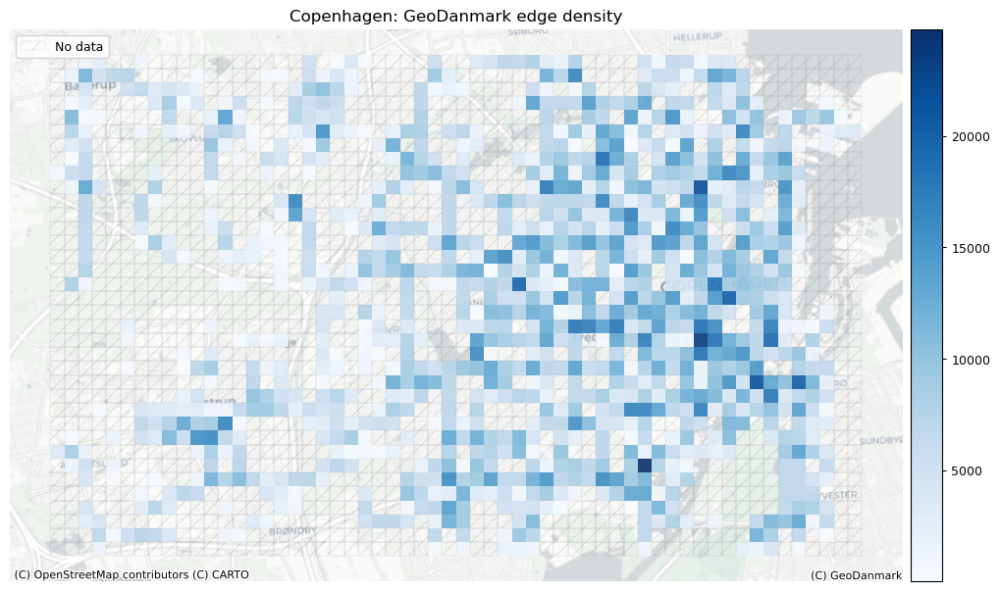

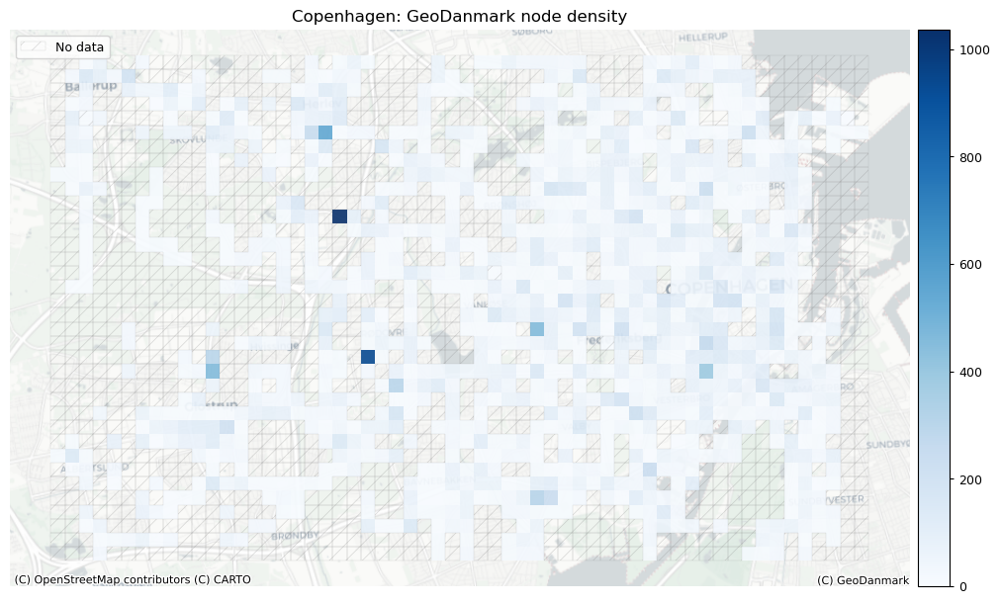

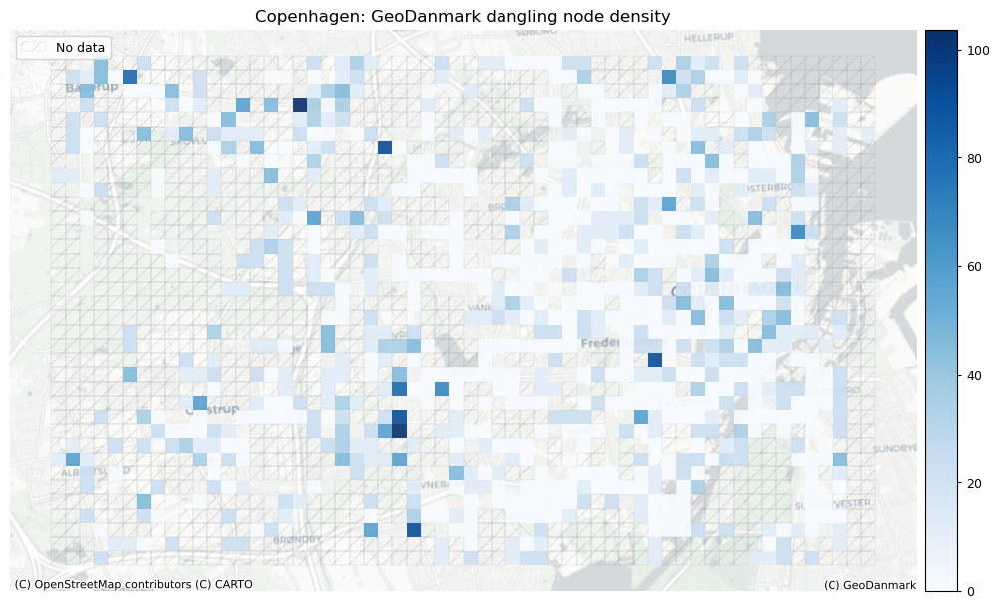

In [5]:
# Network density grid plots

set_renderer(renderer_map)
plot_cols = ["ref_edge_density", "ref_node_density", "ref_dangling_node_density"]
plot_titles = [
    area_name + f": {reference_name} edge density",
    area_name + f": {reference_name} node density",
    area_name + f": {reference_name} dangling node density",
]
filepaths = [
    ref_results_static_maps_fp + "density_edge_reference",
    ref_results_static_maps_fp + "density_node_reference",
    ref_results_static_maps_fp + "density_danglingnode_reference",
]
cmaps = [pdict["pos"], pdict["pos"], pdict["pos"]]
no_data_cols = ["count_ref_edges", "count_ref_nodes", "count_ref_nodes"]

plot_func.plot_grid_results(
    grid=grid,
    plot_cols=plot_cols,
    plot_titles=plot_titles,
    filepaths=filepaths,
    cmaps=cmaps,
    alpha=pdict["alpha_grid"],
    cx_tile=cx_tile_2,
    no_data_cols=no_data_cols,
    attr=reference_name
)

#### 受保护和未受保护基础设施的密度

在 BikeDNA 中，“受保护的基础设施”是指通过高架路缘、护柱或其他物理屏障等与汽车交通分开的所有自行车基础设施，或者不毗邻街道的自行车道。

*不受保护的基础设施*是专门供骑自行车者使用的所有其他类型的车道，但仅通过汽车交通分隔，例如街道上的画线。

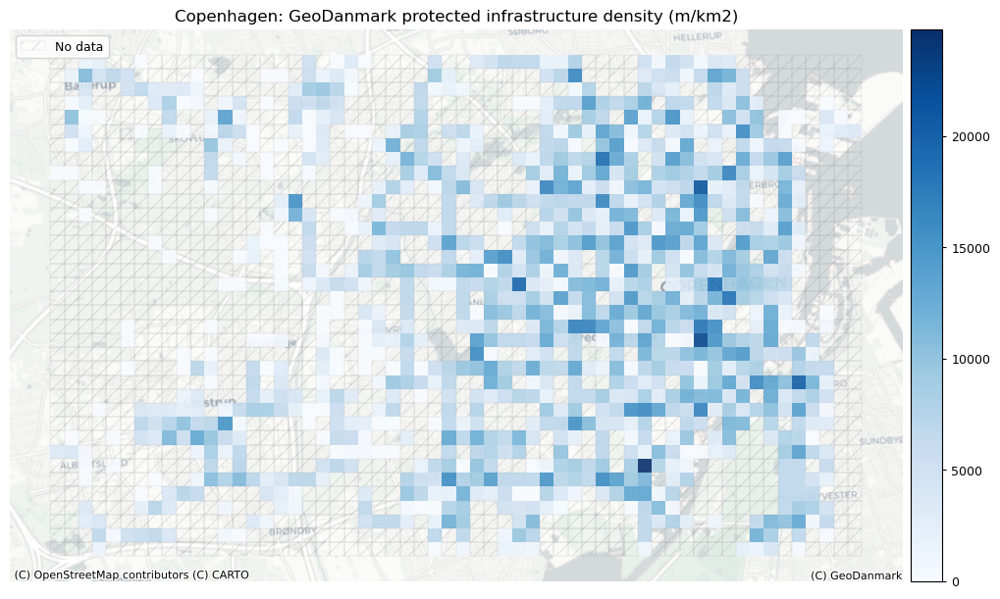

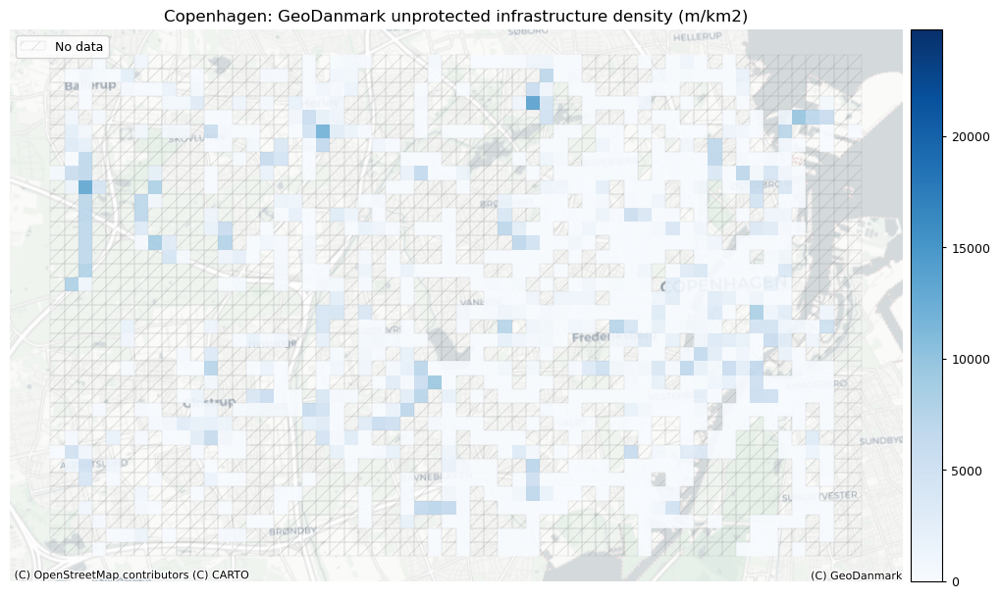

In [6]:
# Network density grid plots

set_renderer(renderer_map)
plot_cols = ["ref_protected_density", "ref_unprotected_density", "ref_mixed_density"]

plot_cols = [p for p in plot_cols if p in grid.columns]

plot_titles = [
    area_name + f": {reference_name} protected infrastructure density (m/km2)",
    area_name + f": {reference_name} unprotected infrastructure density (m/km2)",
    area_name + f": {reference_name} mixed protection infrastructure density (m/km2)"
]

# plot_titles = plot_titles[0:len(plot_cols)]

filepaths = [
    ref_results_static_maps_fp + "density_protected_reference",
    ref_results_static_maps_fp + "density_unprotected_reference",
    ref_results_static_maps_fp + "density_mixed_reference",
]

cmaps = [pdict["pos"]] * len(plot_cols)
no_data_cols = ["ref_protected_density", "ref_unprotected_density", "ref_mixed_density"]
norm_min = [0] * len(plot_cols)
norm_max = [max(grid[plot_cols].fillna(value=0).max())] * len(plot_cols)

plot_func.plot_grid_results(
    grid=grid,
    plot_cols=plot_cols,
    plot_titles=plot_titles,
    filepaths=filepaths,
    cmaps=cmaps,
    alpha=pdict["alpha_grid"],
    cx_tile=cx_tile_2,
    no_data_cols=no_data_cols,
    use_norm=True,
    norm_min=norm_min,
    norm_max=norm_max,
    attr=reference_name
)

＃＃ 网络拓扑结构

本节探讨数据的几何和拓扑特征。 例如，这些是网络密度、断开的组件和悬空（一级）节点。 它还包括探索是否存在彼此非常接近但不共享边缘的节点（边缘下冲的潜在迹象），或者是否存在相交边缘而在相交处没有节点，这可能表明存在数字化错误，该错误将导致数字化错误。 扭曲网络上的路由。

由于大多数自行车网络的分散性，许多指标（例如缺失链接或网络间隙）可以简单地反映基础设施的真实范围([Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324))。 这对于道路网络来说是不同的，例如，断开的组件更容易被解释为数据质量问题。 因此，分析仅将非常小的网络间隙视为潜在的数据质量问题。

### 简化结果

为了比较网络中节点和边之间的结构和真实比率，通过删除所有间隙节点，在笔记本“1b”中创建了仅包括端点和交叉点处的节点的简化网络表示。

比较简化前后网络的度分布是对简化例程的快速健全性检查。 通常，非简化网络中的绝大多数节点都是二级节点； 然而，在简化的网络中，大多数节点的度数不是二。 仅在两种情况下保留二级节点：如果它们代表两种不同类型的基础设施之间的连接点； 或者如果需要它们以避免自循环（起点和终点相同的边）或同一对节点之间的多个边。

<p align="center">
<img src='../../images/network_simplification_illustration.png' width=300/>

*非简化网络（左）和简化网络（右）*。

</p>

**方法**

简化前后的节点度分布如下图所示。

**解释**

通常，节点度分布将从高（简化前）到低（简化后）二度节点计数，而对于所有其他度（1 或 3 及更高），它不会改变。 此外，节点总数将出现大幅下降。 如果简化后的图仍然保持相对较高的二度节点数量，或者简化后具有其他度数的节点数量发生变化，则这可能表明图转换或简化过程存在问题。

<br />

In [7]:
# Decrease in network elements after simplification

edge_percent_diff = (len(ref_edges) - len(ref_edges_simplified)) / len(ref_edges) * 100
node_percent_diff = (len(ref_nodes) - len(ref_nodes_simplified)) / len(ref_nodes) * 100

simplification_results = {
    "edge_percent_diff": edge_percent_diff,
    "node_percent_diff": node_percent_diff,
}

print(
    f"Simplifying the network decreased the number of edges with {edge_percent_diff:.1f}% and the number of nodes with {node_percent_diff:.1f}%."
)

Simplifying the network decreased the number of edges with 91.2% and the number of nodes with 92.2%.


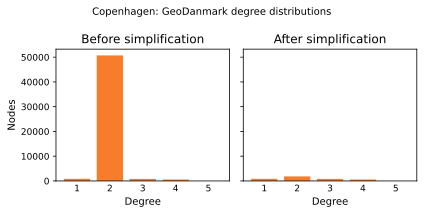

In [8]:
# Node degree distribution

set_renderer(renderer_plot)
fig, ax = plt.subplots(1, 2, figsize=pdict["fsbar_short"], sharey=True)

degree_sequence_before = sorted((d for n, d in ref_graph.degree()), reverse=True)
degree_sequence_after = sorted(
    (d for n, d in ref_graph_simplified.degree()), reverse=True
)


ax[0].bar(*np.unique(degree_sequence_before, return_counts=True), tick_label = np.unique(degree_sequence_before), color=pdict["ref_base"])
ax[0].set_title("Before simplification")
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Nodes")

ax[1].bar(*np.unique(degree_sequence_after, return_counts=True), tick_label = np.unique(degree_sequence_after), color=pdict["ref_base"])
ax[1].set_title("After simplification")
ax[1].set_xlabel("Degree")

plt.suptitle(f"{area_name}: {reference_name} degree distributions")

fig.tight_layout()

plot_func.save_fig(fig, ref_results_plots_fp + "degree_dist_reference")
plt.show();

### 悬空节点

悬空节点是一阶节点，即它们仅附有一条边。 大多数网络自然会包含许多悬空节点。 悬空节点可能出现在实际的死胡同（代表死胡同）或某些特征的端点处，例如 当自行车道在街道中间结束时。 但是，在出现过冲/下冲的情况下，悬空节点也可能会作为数据质量问题出现（请参阅下一节）。 网络中悬空节点的数量在某种程度上也取决于数字化方法，如下图所示。

因此，悬空节点的存在本身并不是数据质量低的标志。 然而，在未知包含许多死胡同的区域中存在大量悬空节点可能表明数字化错误和边缘上冲/下冲问题。

<!-- <table><tr><td><img src='../../images/dangling_nodes_illustration.png' width=300 /></td><td><img src='../ ../images/no_dangling_nodes_illustration.png' width=295 /></td></tr></table> -->

<p align="center">

<img src='../../images/dangling_nodes_illustration_new.png' width=350/>

*左：悬挂节点出现在道路要素结束处。 右：但是，当最后连接单独的特征时，将不会有悬空节点。*

</p>

**方法**

下面，在“get_dangling_nodes”的帮助下获得了所有悬空节点的列表。 然后，绘制包含所有节点的网络。 悬空节点以颜色显示，所有其他节点以黑色显示。

**解释**

我们建议进行可视化分析，以解释悬挂节点的空间分布，特别注意悬挂节点密度高的区域。 重要的是要了解悬挂节点的来源：它们是真正的死胡同还是数字化错误（例如，过冲/下冲）？ 数字化错误数量越多表明数据质量越低。

<br/>

In [9]:
# Compute number of dangling nodes
dangling_nodes = eval_func.get_dangling_nodes(
    ref_edges_simplified, ref_nodes_simplified
)

# Export results
dangling_nodes.to_file(ref_results_data_fp + "dangling_nodes.gpkg", index=False)

# Compute local count and pct of dangling nodes
dn_ref_joined = gpd.overlay(
    dangling_nodes, grid[["geometry", "grid_id"]], how="intersection"
)
df = eval_func.count_features_in_grid(dn_ref_joined, "ref_dangling_nodes")
grid = eval_func.merge_results(grid, df, "left")

grid["ref_dangling_nodes_pct"] = np.round(
    100 * grid.count_ref_dangling_nodes / grid.count_ref_simplified_nodes, 2
)

# set to zero where there are simplified nodes but no dangling nodes
grid["ref_dangling_nodes_pct"].loc[
    grid.count_ref_simplified_nodes.notnull() & grid.ref_dangling_nodes_pct.isnull()
] = 0

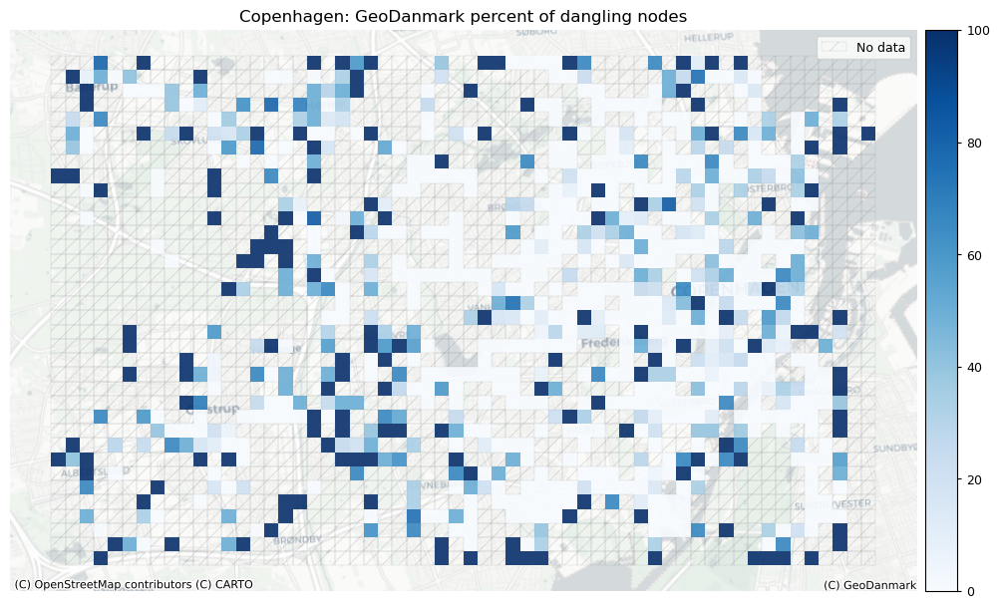

In [10]:
# Plot dangling nodes

set_renderer(renderer_map)
fig, ax = plt.subplots(1, figsize=pdict["fsmap"])

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3.5%", pad="1%")
    
grid.plot(
    cax=cax,
    column="ref_dangling_nodes_pct",
    ax=ax,
    alpha=pdict["alpha_grid"],
    cmap=pdict["pos"],
    legend=True,
)

# add no data patches
grid[grid["count_ref_simplified_nodes"].isnull()].plot(
    cax=cax,
    ax=ax,
    facecolor=pdict["nodata_face"],
    edgecolor=pdict["nodata_edge"],
    linewidth= pdict["line_nodata"],
    hatch=pdict["nodata_hatch"],
    alpha= pdict["alpha_nodata"],
)

ax.legend(handles=[nodata_patch], loc="upper right")
ax.set_title(f"{area_name}: {reference_name} percent of dangling nodes")
ax.set_axis_off()
cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)
cx.add_attribution(ax=ax, text=f"(C) {reference_name}")
txt = ax.texts[-1]
txt.set_position([1,0.00])
txt.set_ha('right')
txt.set_va('bottom')

plot_func.save_fig(fig,ref_results_static_maps_fp + "pct_dangling_nodes_reference")

In [11]:
# Interactive plot of dangling nodes

edges_simplified_folium = plot_func.make_edgefeaturegroup(
    gdf=ref_edges_simplified,
    mycolor=pdict["base"],
    myweight=pdict["line_base"],
    nametag="Edges",
    show_edges=True,
)

nodes_simplified_folium = plot_func.make_nodefeaturegroup(
    gdf=ref_nodes_simplified,
    mysize=pdict["mark_base"],
    mycolor=pdict["base"],
    nametag="All nodes",
    show_nodes=True,
)

dangling_nodes_folium = plot_func.make_nodefeaturegroup(
    gdf=dangling_nodes,
    mysize=pdict["mark_emp"],
    mycolor=pdict["ref_base"],
    nametag="Dangling nodes",
    show_nodes=True,
)

m = plot_func.make_foliumplot(
    feature_groups=[
        edges_simplified_folium,
        nodes_simplified_folium,
        dangling_nodes_folium,
    ],
    layers_dict=folium_layers,
    center_gdf=ref_nodes_simplified,
    center_crs=ref_nodes_simplified.crs,
    attr=reference_name
)

bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
m.fit_bounds(bounds)


m.save(ref_results_inter_maps_fp + "folium_danglingmap_reference.html")

display(m)

In [12]:
print("Interactive map saved at " + ref_results_inter_maps_fp.lstrip("../") + "folium_danglingmap_reference.html")

Interactive map saved at results/REFERENCE/cph_geodk/maps_interactive/folium_danglingmap_reference.html


### 下冲/过冲

当简化网络中的两个节点放置在几米距离内但不共享公共边缘时，通常是由于边缘上冲/下冲或其他数字化错误造成的。 当两个特征应该相交，但实际上彼此非常接近时，就会发生下冲。 当两个特征相遇并且其中一个特征超出另一个特征时，就会发生超调。 请参见下图的说明。 有关过冲/下冲的更详细说明，请参阅 [GIS Lounge 网站](https://www.gislounge.com/digitizing-errors-in-gis/)。

<!-- <表>
<tr><td><img src='../../images/undershoot_illustration.png' width=300 /></td><td><img src='../../images/overshoot_illustration.png' png'宽度=300/></td></tr>
</表>

*左：当两条线要素未正确连接时（例如在相交处），会发生下冲。 右：过冲是指线要素在相交线处延伸太远，而不是在相交处结束的情况。* -->

<p align="center">

<img src='../../images/over_undershoots2.png' width=350/>

*左：当两条线要素未正确连接时（例如在交叉点处），会发生下冲。 右图：过冲是指线要素在相交线处延伸太远，而不是在相交处结束的情况。*

</p>

**方法**

*下冲：*首先，“length_tolerance”（以米为单位）在下面的单元格中定义。 然后，使用“find_undershoots”，所有之间距离最大为“length_tolerance”的悬空节点对都被识别为下冲，并绘制结果。

*超调：*首先，“长度公差”（以米为单位）在下面的单元格中定义。 然后，使用“find_overshoots”，所有附加有悬空节点且最大长度为“length_tolerance”的网络边都被识别为过冲，并绘制结果。

过冲/下冲检测方法的灵感来自于  [Neis et al. (2012)](https://www.mdpi.com/1999-5903/4/1/1)。

**解释**

欠调/过调不一定总是数据质量问题 - 它们可能是网络状况或数字化策略的准确表示。 例如，自行车道可能在转弯后不久突然结束，从而导致超调。 受保护的自行车道有时会被数字化为在交叉路口中断，从而导致交叉路口下冲。

过冲/下冲对数据质量影响的解释取决于上下文。 对于某些应用，例如路由，过冲并不构成特殊的挑战； 然而，鉴于它们扭曲了网络结构，它们可能会给网络分析等其他应用带来问题。 相反，下冲对于路线应用来说是一个严重的问题，特别是如果只考虑自行车基础设施的话。 它们还给网络分析带来了问题，例如对于任何基于路径的度量，例如大多数中心性度量，如介数中心性。

<br />

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
在分析过冲和下冲时，用户可以修改过冲和下冲的长度公差。 <br>
例如，过冲的长度容差为 3 米，这意味着只有长度为 3 米或更小的边缘片段才被视为过冲。<br>
下冲容差为 5 米，意味着只有 5 米或更小的间隙才被视为下冲。
</div>

In [13]:
# USER INPUT: LENGTH TOLERANCE FOR OVER- AND UNDERSHOOTS
length_tolerance_over = 3
length_tolerance_under = 3

for s in [length_tolerance_over, length_tolerance_under]:
    assert isinstance(s, int) or isinstance(s, float), print(
        "Settings must be integer or float values!"
    )

print(f"Running overshoot analysis with a tolerance threshold of {length_tolerance_over} m.")
print(f"Running undershoot analysis with a tolerance threshold of {length_tolerance_under} m.")

Running overshoot analysis with a tolerance threshold of 3 m.
Running undershoot analysis with a tolerance threshold of 3 m.


In [14]:
### Overshoots
overshoots = eval_func.find_overshoots(
    dangling_nodes,
    ref_edges_simplified,
    length_tolerance_over,
    return_overshoot_edges=True,
)

print(
    f"{len(overshoots)} potential overshoots were identified with a length tolerance of {length_tolerance_over} m."
)

### Undershoots
undershoot_dict, undershoot_nodes = eval_func.find_undershoots(
    dangling_nodes,
    ref_edges_simplified,
    length_tolerance_under,
    "edge_id",
    return_undershoot_nodes=True,
)

print(
    f"{len(undershoot_nodes)} potential undershoots were identified with a length tolerance of {length_tolerance_under} m."
)

21 potential overshoots were identified with a length tolerance of 3 m.
11 potential undershoots were identified with a length tolerance of 3 m.


In [15]:
# Save to csv
overshoots[["edge_id", "length"]].to_csv(
    ref_results_data_fp + f"overshoot_edges_{length_tolerance_over}.csv", header = ["edge_id", "length (m)"], index = False
)


pd.DataFrame(undershoot_nodes["nodeID"].to_list(), columns=["node_id"]).to_csv(
    ref_results_data_fp + f"undershoot_nodes_{length_tolerance_under}.csv", index=False
)

In [16]:
# Interactive plot over/undershoots

simplified_edges_folium = plot_func.make_edgefeaturegroup(
    gdf=ref_edges_simplified,
    mycolor=pdict["base"],
    myweight=pdict["line_base"],
    nametag="Edges",
    show_edges=True,
)

fg = [simplified_edges_folium]

if len(overshoots) > 0 or len(undershoot_nodes) > 0:

    if len(overshoots) > 0:

        overshoots_folium = plot_func.make_edgefeaturegroup(
            gdf=overshoots,
            mycolor=pdict["ref_emp2"],
            myweight=pdict["line_emp2"],
            nametag="Overshoots",
            show_edges=True,
        )

        fg.append(overshoots_folium)

    if len(undershoot_nodes) > 0:

        undershoot_nodes_folium = plot_func.make_nodefeaturegroup(
            gdf=undershoot_nodes,
            mysize=pdict["mark_emp"],
            mycolor=pdict["ref_contrast"],
            nametag="Undershoot nodes",
            show_nodes=True,
        )

        fg.append(undershoot_nodes_folium)

    m = plot_func.make_foliumplot(
        feature_groups=fg,
        layers_dict=folium_layers,
        center_gdf=ref_nodes_simplified,
        center_crs=ref_nodes_simplified.crs,
    )

    bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
    m.fit_bounds(bounds)

    m.save(
        ref_results_inter_maps_fp
        + f"underovershoots_{length_tolerance_under}_{length_tolerance_over}_reference.html"
    )

    display(m)

if len(undershoot_nodes) == 0:
    print("There are no undershoots to plot.")
if len(overshoots) == 0:
    print("There are no overshoots to plot.")

In [17]:
if len(overshoots) > 0 or len(undershoot_nodes) > 0:
    print("Interactive map saved at " + ref_results_inter_maps_fp.lstrip("../") + f"overundershoots_{length_tolerance_under}_{length_tolerance_over}_reference.html")
else:
    print("There are no under/overshoots to plot.")

Interactive map saved at results/REFERENCE/cph_geodk/maps_interactive/overundershoots_3_3_reference.html


## 网络组件

断开连接的组件不共享任何元素（节点/边）。 换句话说，不存在可以从一个断开连接的组件通向另一组件的网络路径。 如上所述，大多数现实世界的自行车基础设施网络确实由许多断开连接的组件组成（[Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324)） 。 然而，当两个断开的组件彼此非常接近时，这可能是边缘缺失或另一个数字化错误的迹象。

**方法**

首先，在“return_components”的帮助下，获得网络所有（断开连接的）组件的列表。 打印组件总数，并以不同颜色绘制所有组件以进行视觉分析。 接下来，绘制组件大小分布（组件按其包含的网络长度排序），然后绘制最大连接组件的图。

**解释**

与之前的许多分析步骤一样，该领域的知识对于正确解释成分分析至关重要。 鉴于数据准确地代表了实际的基础设施，较大的组件表示连贯的网络部分，而较小的组件表示分散的基础设施（例如，沿着街道的一条自行车道，不连接到任何其他自行车基础设施）。 大量彼此邻近的断开组件表明数字化错误或丢失数据。

### 断开的组件

In [18]:
ref_components = eval_func.return_components(ref_graph_simplified)
print(
    f"The network in the study area has {len(ref_components)} disconnected components."
)

The network in the study area has 204 disconnected components.


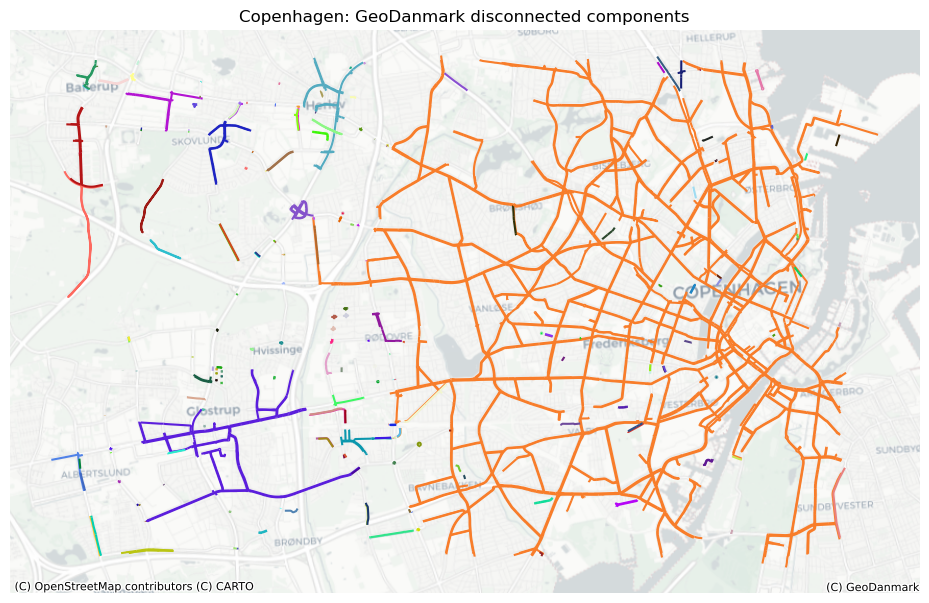

In [19]:
# Plot disconnected components

set_renderer(renderer_map)

# set seed for colors
np.random.seed(42)

# generate enough random colors to plot all components
randcols = np.random.rand(len(ref_components), 3)
randcols[0, :] = col_to_rgb(pdict['ref_base'])

fig, ax = plt.subplots(1, 1, figsize=pdict["fsmap"])

ax.set_title(f"{area_name}: {reference_name} disconnected components")

ax.set_axis_off()

for j, c in enumerate(ref_components):
    if len(c.edges) > 0:
        edges = ox.graph_to_gdfs(c, nodes=False)
        edges.plot(ax=ax, color=randcols[j])

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)
cx.add_attribution(ax=ax, text=f"(C) {reference_name}")
txt = ax.texts[-1]
txt.set_position([1,0.00])
txt.set_ha('right')
txt.set_va('bottom')

plot_func.save_fig(fig, ref_results_static_maps_fp + "all_components_reference")

### 每个网格单元的组件

In [20]:
# Assign component ids to grid
grid = eval_func.assign_component_id_to_grid(
    ref_edges_simplified,
    ref_edges_simp_joined,
    ref_components,
    grid,
    prefix="ref",
    edge_id_col="edge_id",
)

fill_na_dict = {"component_ids_ref": ""}
grid.fillna(value=fill_na_dict, inplace=True)

grid["component_count_ref"] = grid.component_ids_ref.apply(lambda x: len(x))

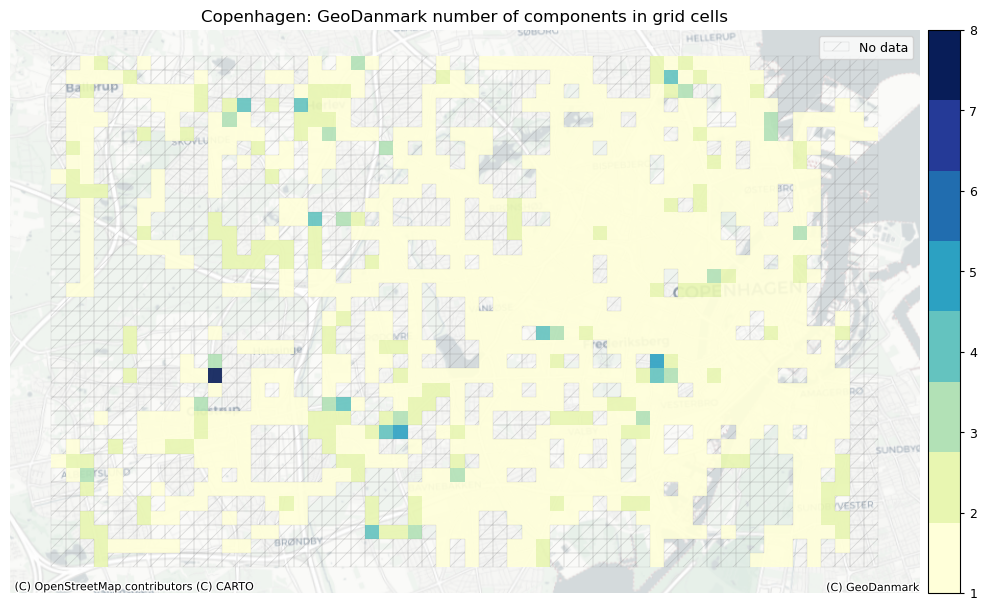

In [21]:
# Plot number of components per grid cell

set_renderer(renderer_map)

fig, ax = plt.subplots(1, 1, figsize=pdict["fsmap"])

ncolors = grid["component_count_ref"].max()

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3.5%", pad="1%")

mycm = cm.get_cmap(pdict["seq"], ncolors)
grid[grid.component_count_ref>0].plot(
    cax=cax,
    ax=ax,
    column="component_count_ref",
    legend=True,
    legend_kwds={'ticks': list(range(1, ncolors+1))},
    cmap=mycm,
    alpha=pdict["alpha_grid"],
)

# add no data patches
grid[grid["count_ref_edges"].isnull()].plot(
    cax=cax,
    ax=ax,
    facecolor=pdict["nodata_face"],
    edgecolor=pdict["nodata_edge"],
    linewidth= pdict["line_nodata"],
    hatch=pdict["nodata_hatch"],
    alpha=pdict["alpha_nodata"],
)

ax.legend(handles=[nodata_patch], loc="upper right")

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)
cx.add_attribution(ax=ax, text=f"(C) {reference_name}")
txt = ax.texts[-1]
txt.set_position([1,0.00])
txt.set_ha('right')
txt.set_va('bottom')
ax.set_title(area_name + f": {reference_name} number of components in grid cells") 
ax.set_axis_off()

plot_func.save_fig(fig, ref_results_static_maps_fp + f"number_of_components_in_grid_cells_reference")

### 组件长度分布

所有网络组件长度的分布可以在所谓的 *Zipf 图* 中可视化，该图按等级对每个组件的长度进行排序，在左侧显示最大组件的长度，然后是第二大组件的长度，依此类推，直到 右侧最小组件的长度。 当 Zipf 图遵循 [双对数比例](https://en.wikipedia.org/wiki/Logarithmic_scale) 中的直线时，这意味着找到小的不连续组件的机会比传统分布的预期要高得多  [(Clauset et al., 2009)]( https://epubs.siam.org/doi/abs/10.1137/070710111)。 这可能意味着网络没有合并，只有分段或随机添加  [(Szell et al., 2022)](https://www.nature.com/articles/s41598-022-10783-y)，或者数据本身存在许多间隙和拓扑错误，导致小的断开组件。

但是，也可能发生最大的连通分量（图中最左边的标记，等级为 $10^0$）是明显的异常值，而图的其余部分则遵循不同的形状。 这可能意味着在基础设施层面，大部分基础设施已连接到一个大型组件，并且数据反映了这一点 - 即数据在很大程度上没有受到间隙和缺失链接的影响。

自行车网络也可能介于两者之间，有几个大型组件作为异常值。

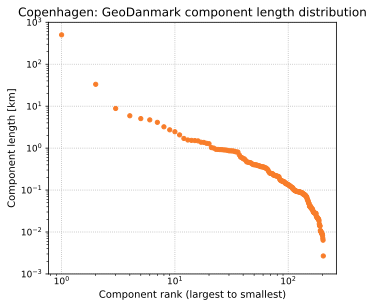

In [22]:
# Zipf plot of component lengths

set_renderer(renderer_plot)

components_length = {}

for i, c in enumerate(ref_components):
    c_length = 0
    for (u, v, l) in c.edges(data="length"):
        c_length += l
    components_length[i] = c_length

components_df = pd.DataFrame.from_dict(components_length, orient="index")
components_df.rename(columns={0: "component_length"}, inplace=True)

fig = plt.figure(figsize=pdict["fsbar_small"])
axes = fig.add_axes([0, 0, 1, 1])

axes.set_axisbelow(True)
axes.grid(True,which="major",ls="dotted")
yvals = sorted(list(components_df["component_length"] / 1000), reverse = True)
axes.scatter(
    x=[i+1 for i in range(len(components_df))],
    y=yvals,
    s=18,
    color=pdict["ref_base"],
)
axes.set_ylim(ymin=10**math.floor(math.log10(min(yvals))), ymax=10**math.ceil(math.log10(max(yvals))))
axes.set_xscale("log")
axes.set_yscale("log")

axes.set_ylabel("Component length [km]")
axes.set_xlabel("Component rank (largest to smallest)")
axes.set_title(area_name+": " + f"{reference_name} component length distribution")

plot_func.save_fig(fig, ref_results_plots_fp + "component_length_distribution_reference")

In [23]:
largest_cc = max(ref_components, key=len)

largest_cc_length = 0

for (u, v, l) in largest_cc.edges(data="length"):

    largest_cc_length += l

largest_cc_pct = largest_cc_length / components_df["component_length"].sum() * 100

print(
    f"The largest connected component contains {largest_cc_pct:.2f}% of the network length."
)

lcc_edges = ox.graph_to_gdfs(
    G=largest_cc, nodes=False, edges=True, node_geometry=False, fill_edge_geometry=False
)

# Export to GPKG
lcc_edges[["edge_id", "geometry"]].to_file(
    ref_results_data_fp + "largest_connected_component.gpkg"
)

The largest connected component contains 80.04% of the network length.


### 最大连通分量

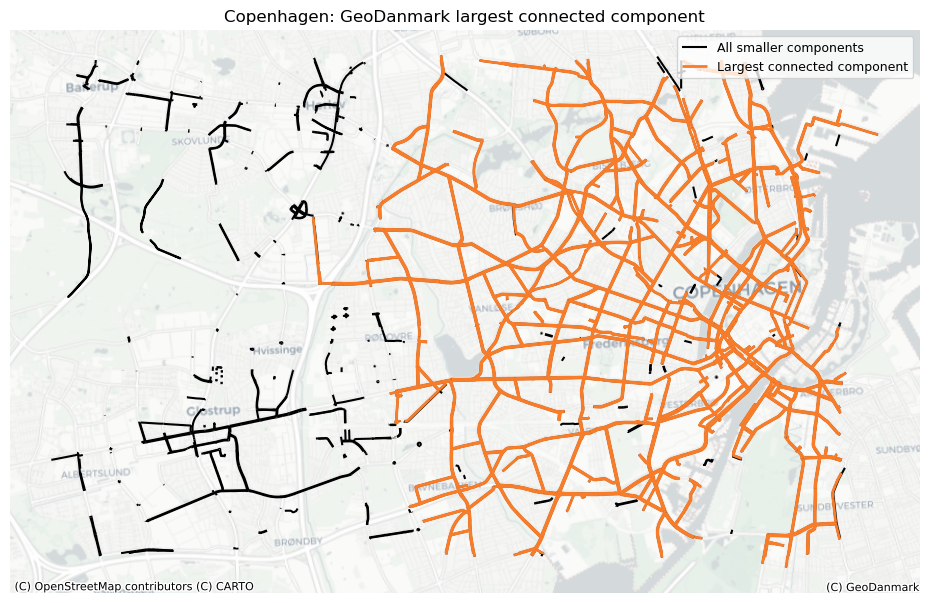

In [24]:
# Plot of largest connected component

set_renderer(renderer_map)
fig, ax = plt.subplots(1, 1, figsize=pdict["fsmap"])
ref_edges_simplified.plot(ax=ax, color = pdict["base"], linewidth = 1.5, label = "All smaller components")
lcc_edges.plot(ax=ax, color=pdict["ref_base"], linewidth = 2, label = "Largest connected component")
grid.plot(ax=ax,alpha=0)
ax.set_axis_off()
ax.set_title(area_name + f": {reference_name} largest connected component")
ax.legend()

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)
cx.add_attribution(ax=ax, text=f"(C) {reference_name}")
txt = ax.texts[-1]
txt.set_position([1,0.00])
txt.set_ha('right')
txt.set_va('bottom')

plot_func.save_fig(fig, ref_results_static_maps_fp + f"largest_conn_comp_reference")

In [25]:
# Save plot without basemap for potential report titlepage

set_renderer(renderer_map)
fig, ax = plt.subplots(1, 1, figsize=pdict["fsmap"])
ref_edges_simplified.plot(ax=ax, color = pdict["base"], linewidth = 1.5, label = "Disconnected components")
lcc_edges.plot(ax=ax, color=pdict["ref_base"], linewidth = 2, label = "Largest connected component")
ax.set_axis_off()

plot_func.save_fig(fig, ref_results_static_maps_fp + "titleimage",plot_res="high")
plt.close()

### 缺少链接

在组件之间潜在缺失链接的图中，将绘制与另一个组件上的边的指定距离内的所有边。 断开的边缘之间的间隙用标记突出显示。
因此，该地图突出显示了边缘，尽管这些边缘彼此非常接近，但它们是断开连接的，因此不可能在边缘之间的自行车基础设施上骑自行车。

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
在分析组件之间潜在的缺失链接时，用户必须定义两个组件之间的距离被认为足够低以至于怀疑数字化错误的阈值。
</div>

In [26]:
# DEFINE MAX BUFFER DISTANCE BETWEEN COMPONENTS CONSIDERED A GAP/MISSING LINK
component_min_distance = 10

assert isinstance(component_min_distance, int) or isinstance(
    component_min_distance, float
), print("Setting must be integer or float value!")

print(f"Running analysis with component distance threshold of {component_min_distance} meters.")

Running analysis with component distance threshold of 10 meters.


In [27]:
component_gaps = eval_func.find_adjacent_components(
    components=ref_components,
    buffer_dist=component_min_distance,
    crs=study_crs,
    edge_id="edge_id",
)
component_gaps_gdf = gpd.GeoDataFrame.from_dict(
    component_gaps, orient="index", geometry="geometry", crs=study_crs
)

edge_ids = set(
    component_gaps_gdf["edge_id" + "_left"].to_list()
    + component_gaps_gdf["edge_id" + "_right"].to_list()
)

edge_ids = [int(i) for i in edge_ids]
edges_with_gaps = ref_edges_simplified.loc[ref_edges_simplified.edge_id.isin(edge_ids)]

In [28]:
# Save to csv
pd.DataFrame(edge_ids, columns=["edge_id"]).to_csv(
    ref_results_data_fp + f"component_gaps_edges_{component_min_distance}.csv",
    index=False,
)

component_gaps_gdf.to_file(
    ref_results_data_fp + f"component_gaps_centroids_{component_min_distance}.gpkg"
)

In [29]:
# Interactive plot of adjacent components

if len(component_gaps) > 0:

    simplified_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=ref_edges_simplified,
        mycolor=pdict["ref_base"],
        myweight=pdict["line_base"],
        nametag="All edges",
        show_edges=True,
    )

    component_issues_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=edges_with_gaps,
        mycolor=pdict["ref_emp"],
        myweight=pdict["line_emp"],
        nametag="Adjacent disconnected edges",
        show_edges=True,
    )

    component_issues_gaps_folium = plot_func.make_markerfeaturegroup(
        gdf=component_gaps_gdf, nametag="Component gaps", show_markers=True
    )

    m = plot_func.make_foliumplot(
        feature_groups=[
            simplified_edges_folium,
            component_issues_edges_folium,
            component_issues_gaps_folium,
        ],
        layers_dict=folium_layers,
        center_gdf=ref_nodes_simplified,
        center_crs=ref_nodes_simplified.crs,
    )

    bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
    m.fit_bounds(bounds)
    m.save(ref_results_inter_maps_fp + f"component_gaps_{component_min_distance}_reference.html")

    display(m)

In [30]:
if len(component_gaps) > 0:
    print("Interactive map saved at " + ref_results_inter_maps_fp.lstrip("../") + f"component_gaps_{component_min_distance}_reference.html")
else:
    print("There are no component gaps to plot.")

Interactive map saved at results/REFERENCE/cph_geodk/maps_interactive/component_gaps_10_reference.html


### 组件连接

在这里，我们可视化每个单元格可以到达的单元格数量之间的差异。 这是对网络连接性的粗略测量，但具有计算成本低的优点，因此能够快速突出网络连接性的明显差异。

In [31]:
ref_components_cell_count = eval_func.count_component_cell_reach(
    components_df, grid, "component_ids_ref"
)
grid["cells_reached_ref"] = grid["component_ids_ref"].apply(
    lambda x: eval_func.count_cells_reached(x, ref_components_cell_count)
    if x != ""
    else 0
)

grid["cells_reached_ref_pct"] = grid.apply(
    lambda x: np.round((x.cells_reached_ref / len(grid)) * 100, 2), axis=1
)

grid.loc[grid["cells_reached_ref_pct"] == 0, "cells_reached_ref_pct"] = np.NAN

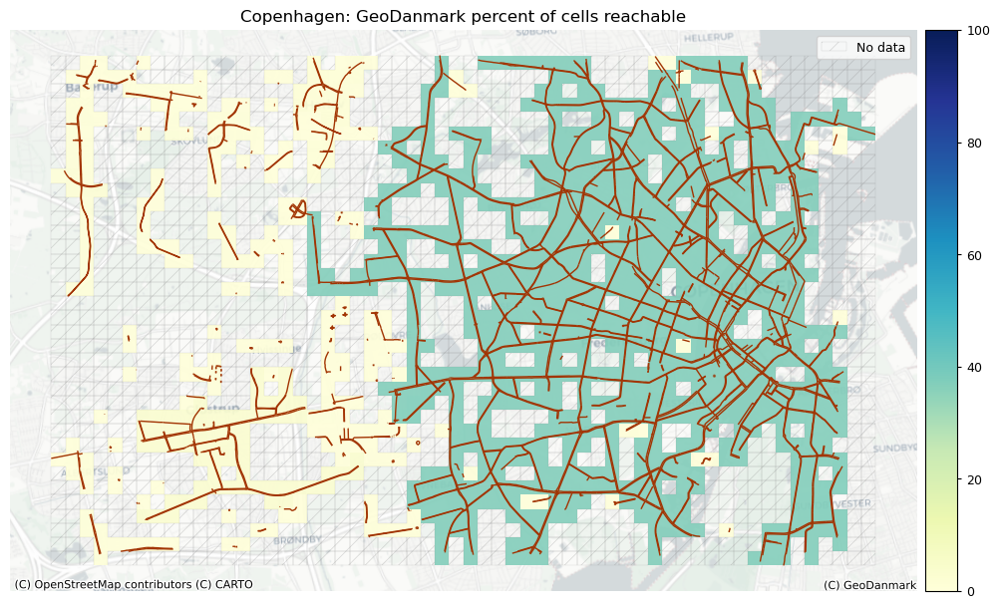

In [32]:
# Plot percent of cells reachable

set_renderer(renderer_map)

fig, ax = plt.subplots(1, 1, figsize=pdict["fsmap"])

# norm for color bars
cbnorm_reach = colors.Normalize(vmin=0, vmax=100)
cbnorm_reach_diff = colors.Normalize(vmin=-100, vmax=100)

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3.5%", pad="1%")

grid.plot(
    cax=cax,
    ax=ax,
    column="cells_reached_ref_pct",
    legend=True,
    cmap=pdict["seq"],
    norm=cbnorm_reach,
    alpha=pdict["alpha_grid"],
)

ref_edges_simplified.plot(ax=ax, color=pdict["ref_emp"], linewidth=pdict["line_base"])

# add no data patches
grid[grid["count_ref_edges"].isnull()].plot(
    cax=cax,
    ax=ax,
    facecolor=pdict["nodata_face"],
    edgecolor=pdict["nodata_edge"],
    linewidth= pdict["line_nodata"],
    hatch=pdict["nodata_hatch"],
    alpha=pdict["alpha_nodata"],
)

ax.legend(handles=[nodata_patch], loc="upper right")

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)
cx.add_attribution(ax=ax, text=f"(C) {reference_name}")
txt = ax.texts[-1]
txt.set_position([1,0.00])
txt.set_ha('right')
txt.set_va('bottom')
ax.set_title(area_name+f": {reference_name} percent of cells reachable")
ax.set_axis_off()

plot_func.save_fig(fig,ref_results_static_maps_fp + "percent_cells_reachable_grid_reference")

In [33]:
components_results = {}
components_results["component_count"] = len(ref_components)
components_results["largest_cc_pct_size"] = largest_cc_pct
components_results["largest_cc_length"] = largest_cc_length
components_results["count_component_gaps"] = len(component_gaps)

## 概括

In [34]:
summarize_results = {**density_results, **components_results}

summarize_results["count_dangling_nodes"] = len(dangling_nodes)
summarize_results["count_overshoots"] = len(overshoots)
summarize_results["count_undershoots"] = len(undershoot_nodes)

# Add total node count and total infrastructure length
summarize_results["total_nodes"] = len(ref_nodes_simplified)
summarize_results["total_length"] = ref_edges_simplified.infrastructure_length.sum() / 1000

summarize_results_df = pd.DataFrame.from_dict(summarize_results, orient="index")
summarize_results_df.rename({0: " "}, axis=1, inplace=True)

# Convert length to km
summarize_results_df.loc["largest_cc_length"] = (
    summarize_results_df.loc["largest_cc_length"] / 1000
)

summarize_results_df = summarize_results_df.reindex([
    'total_length',
    'protected_density_m_sqkm',
    'unprotected_density_m_sqkm',
    'mixed_density_m_sqkm',
    'edge_density_m_sqkm',
    'total_nodes',
    'count_dangling_nodes',
    'node_density_count_sqkm',
    'dangling_node_density_count_sqkm',
    'count_overshoots',
    'count_undershoots',
    'component_count',
    'largest_cc_length',
    'largest_cc_pct_size', 
    'count_component_gaps'
     ])

rename_metrics = {
    "total_length": "Total infrastructure length (km)",
    "total_nodes": "Nodes",
    "edge_density_m_sqkm": "Bicycle infrastructure density (m/km2)",
    "node_density_count_sqkm": "Nodes per km2",
    "dangling_node_density_count_sqkm": "Dangling nodes per km2",
    "protected_density_m_sqkm": "Protected bicycle infrastructure density (m/km2)",
    "unprotected_density_m_sqkm": "Unprotected bicycle infrastructure density (m/km2)",
    "mixed_density_m_sqkm": "Mixed protection bicycle infrastructure density (m/km2)",
    "component_count": "Components",
    "largest_cc_pct_size": "Largest component's share of network length",
    "largest_cc_length": "Length of largest component (km)",
    "count_component_gaps": "Component gaps",
    "count_dangling_nodes": "Dangling nodes",
    "count_overshoots": "Overshoots",
    "count_undershoots": "Undershoots",
}

summarize_results_df.rename(rename_metrics, inplace=True)
summarize_results_df.style.pipe(format_ref_style)

,
Total infrastructure length (km),626
Protected bicycle infrastructure density (m/km2),"2,999"
Unprotected bicycle infrastructure density (m/km2),455
Mixed protection bicycle infrastructure density (m/km2),0
Bicycle infrastructure density (m/km2),"3,454"
Nodes,"4,125"
Dangling nodes,870
Nodes per km2,23
Dangling nodes per km2,5
Overshoots,21


## 保存结果

In [35]:
all_results = {}

all_results["network_density"] = density_results
all_results["count_overshoots"] = len(overshoots)
all_results["count_undershoots"] = len(undershoot_nodes)
all_results["dangling_node_count"] = len(dangling_nodes)
all_results["simplification_outcome"] = simplification_results
all_results["component_analysis"] = components_results

with open(ref_intrinsic_fp, "w") as outfile:
    json.dump(all_results, outfile)

# Save summary dataframe
summarize_results_df.to_csv(
    ref_results_data_fp + "intrinsic_summary_results.csv", index=True
)

# Save grid with results
with open(ref_intrinsic_grid_fp, "wb") as f:
    pickle.dump(grid, f)

***

In [36]:
from time import strftime
print("Time of analysis: " + strftime("%a, %d %b %Y %H:%M:%S"))

Time of analysis: Mon, 18 Dec 2023 20:21:28
